# <font color = 'red'><center>Data Mining for Better Material Synthesis: the Case of Pulsed Laser Deposition of Complex Oxides</font></center>
<font size = 3>
<i><center>Steven R. Young<sup>1,2</sup>, Artem Maksov<sup>2,3,4</sup>, Maxim Ziatdinov<sup>2,3</sup>, Ye Cao<sup>2,3</sup>, Matthew Burch<sup>2,3</sup>, Janakiraman Balachandran<sup>2,3</sup>, Linglong Li<sup>2,3,5</sup>, Suhas Somnath<sup>2,3,6</sup>, Robert M. Patton<sup>2,3</sup>, Sergei V. Kalinin<sup>2,3</sup>,  and Rama K. Vasudevan<sup>2,3</sup></i></center>
<p>
<sup>1</sup>Computational Sciences and Engineering Division, <sup>2</sup>Institute for Functional Imaging of Materials, and <sup>3</sup>Center for Nanophase Materials Sciences, Oak Ridge National Laboratory, Oak Ridge TN 37831, USA
<p>
<sup>4</sup>Bredesen Center for Interdisciplinary Research, University of Tennessee, Knoxville, Tennessee 37996, United States 
<p>
<sup>5</sup>Multi-disciplinary Materials Research Center, Frontier Institute of Science and Technology, Xi’an Jiaotong University, Xi’an, Shaanxi, 710049, China
<p>
<sup>6</sup>Compute and Data Environment for Science, Oak Ridge National Laboratory, Oak Ridge TN 37831, USA </font>
<font size = 4>
<p>
<p><font color = "Blue">Notebook by  R. Vasudevan and M. Ziatdinov.
<p>Data assimilated by Maksov, Ziatdinov, Cao, Somnath, Li, Burch, Balachandran and Vasudevan.
<p>BRAT annotation tool for PLD paper mining developed by Steven Young. </font> 
<p>
<font color = "green"><p> In this notebook, we show how to load, visualize and anlayze data from the PLD Database we constructed. All the codes necessary to setup the infrastructure (i.e., the text annotation tool, a scrubbing tool to 'clean-up' entries, and this notebook) are available on our github repository, which can be found at:
<p>
http://www.github.com/ORNL_PLD_Mining
<p>
For further information or questions, please email: vasudevanrk@ornl.gov </font> </font>

<i>NB: This notebook is designed to run on python v3. It will likely work in python 2, but this has not been tested.</i>

In [1]:
#Install the required dependencies
#!pip install numpy, pandas, graphviz, scipy, scikit-learn, matplotlib

In [139]:
#Import the required dependencies
%matplotlib inline

from os import path, mkdir
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.lines as mlines
import graphviz
from scipy.stats import pearsonr
from sklearn.cross_decomposition import CCA
from sklearn.model_selection import train_test_split as tts
from sklearn import tree
from sklearn.preprocessing import normalize
from sklearn.mixture import GMM

In [3]:
#Define a simple function that takes care of average values
def avg_float(input_string):
    if type(input_string)==str:
        if 'AVG' in input_string:
            return float(input_string[4:])
        else:
            return float(input_string)
    else:
        return float(input_string)


# Data Import as Pandas Dataframe
In the following section, we show how to import the data into a pandas dataframe object, from the given csv file that is exported from the database.  We then display the resulting dataframe

In [4]:
#folder_path = r'.'
folder_path = r'C:\Users\rvv\Dropbox (ORNL)\SEED Text mining Project\Data'
file_name = r'database_combined_v3.csv'

#Save the figures in a sub-folder called Figures.
try:
    mkdir(path.join(folder_path,'Figures'))
    figure_folder = path.join(folder_path,'Figures')
except FileExistsError:
    figure_folder = path.join(folder_path,'Figures')
    
#Here, we read in the entries from the csv file, noting the columns from which we wish to pull the data.

df1 = pd.read_csv(path.join(folder_path, file_name), 
                  usecols= ['substrate', 'film_thickness(nm)', 'oxygen_pressure(mbar)',
                    'growth_temperature(C)','compound', 'repetition_rate(Hz)',
                            'fluence(J/cm2)','critical_magnetic_temperature(K)',
                       'critical_ferroelectric_temperature(K)', 'remnant_polarization(uC/cm2)'], 
                 encoding = 'latin-1') #change encoding to latin-1 if utf-8 does not function correctly

# Fill missing values with zero
df1 = df1.fillna(0)

#Once we have the data, we wish to conver them to a dictionary with key-value pairs.
Films = {}

Films['oxygen_pressure'] = []
Films['film_thickness'] = []
Films['growth_temperature'] = []
Films['compound_grown'] = []
Films['substrate'] = []
Films['parent_compound'] = []
Films['fluence'] = []
Films['rep_rate'] = []
Films['tc-m'] = []
Films['tc-f'] = []
Films['polarization'] = []

#Fill dictionaries with lists representing data (non-zero values) on growth parameters and physical properties for each film

for r in range(df1.shape[0]):
    Films['oxygen_pressure'].append(avg_float(df1['oxygen_pressure(mbar)'][r]))
    Films['film_thickness'].append(avg_float(df1['film_thickness(nm)'][r]))
    Films['growth_temperature'].append(avg_float(df1['growth_temperature(C)'][r]))
    Films['rep_rate'].append(avg_float(df1['repetition_rate(Hz)'][r]))
    Films['fluence'].append(avg_float(df1['fluence(J/cm2)'][r]))
    Films['tc-m'].append(avg_float(df1['critical_magnetic_temperature(K)'][r]))
    Films['tc-f'].append(avg_float(df1['critical_ferroelectric_temperature(K)'][r]))
    Films['polarization'].append(avg_float(df1['remnant_polarization(uC/cm2)'][r]))

    compound_name = str(df1['compound'][r])

    #Because of variations in the way substrate names and compoudn names are given, we
    #decided to use 'parent' compound names to group similar entries.
    #the logic is extremely straightforward as seen in the statements below.
    
    if len(compound_name)>2:

        Films['compound_grown'].append(compound_name)

        if 'La' and 'Ca' in compound_name or 'LCMO' in compound_name:
            Films['parent_compound'].append('LCMO')

        elif 'La' and 'Sr' in compound_name or 'LSMO' in compound_name:
            Films['parent_compound'].append('LSMO')

        elif 'LMO' in compound_name or 'LaMnO3' in compound_name:
            Films['parent_compound'].append('LMO')

        elif 'Pb' in compound_name or 'Zr'  in compound_name or 'PZT' in compound_name:
            Films['parent_compound'].append('PZT')
        elif 'Bi' in compound_name or 'Fe' in compound_name or 'BFO' in compound_name:
            Films['parent_compound'].append('BFO')

        else:
            Films['compound_grown'].append('Unknown')
            Films['parent_compound'].append('Unknown')

        if 'SrTiO3' in str(df1['substrate'][r]) or 'STO' in str(df1['substrate'][r]):
            Films['substrate'].append('SrTiO3')
        elif 'LaAlO3' in str(df1['substrate'][r]) or 'LAO' in str(df1['substrate'][r]):
            Films['substrate'].append('LaAlO3')
        elif 'Si' in str(df1['substrate'][r]):
            Films['substrate'].append('Silicon')
        else:
            Films['substrate'].append('Other')

    
#Once we have the dictionary created, we can convert this to the pandas dataframe object
Film_m = {key: pd.DataFrame(value) for key,value in Films.items()}
Film_df = pd.concat(Film_m, axis=1)

#Show the dataframe
Film_df

,compound_grown,film_thickness,fluence,growth_temperature,oxygen_pressure,parent_compound,polarization,rep_rate,substrate,tc-f,tc-m
,0,0,0,0,0,0,0,0,0,0,0
0,PbZr0.52Ti0.48O3,400.0,0.0,550.0,0.200000,PZT,29.0,0.0,LaAlO3,0.0,0.0
1,PbZr0.52Ti0.48O3,400.0,0.0,550.0,0.200000,PZT,17.0,0.0,LaAlO3,0.0,0.0
2,PbZr0.52Ti0.48O3,400.0,0.0,550.0,0.200000,PZT,20.0,0.0,LaAlO3,0.0,0.0
3,PbZr0.52Ti0.48O3,400.0,0.0,550.0,0.200000,PZT,31.0,0.0,LaAlO3,0.0,0.0
4,"Pb(Zr,Ti)O3",400.0,0.0,550.0,0.200000,PZT,58.0,0.0,LaAlO3,0.0,0.0
5,Pb(Zr0.2Ti0.8)O3,74.0,0.0,600.0,0.000000,PZT,58.0,5.0,SrTiO3,0.0,0.0
6,Pb(Zr0.2Ti0.8)O3,215.0,0.0,600.0,0.000000,PZT,40.0,5.0,SrTiO3,0.0,0.0
7,Pb(Zr0.2Ti0.8)O3,50.0,0.0,600.0,0.000000,PZT,80.0,5.0,SrTiO3,0.0,0.0
8,Pb(Zr52Ti48)O3,0.0,2.0,650.0,0.100000,PZT,0.0,0.0,Other,0.0,0.0


<font size =5>Save the Dataframe as a pickled file. This allows easy retrieval later.</font>

In [5]:
#Store the dataframe in a pickle
output_file_name = file_name[:-4] + '_pandas.p'
Film_df.to_pickle(path.join(folder_path, output_file_name))  # where to save it, usually as a .pkl

<font size =4>To make analysis easier, we will group entries into parent compounds, make a dictionary of colors for the available substrates, and define convenience functions for plotting 3D scatter plots</font>

In [6]:
#Some organization for plotting convenience
#Set colors for the Substrates
colors_dict = dict()
colors_dict['SrTiO3']='blue'
colors_dict['LaAlO3']='red'
colors_dict['Silicon']='black'
colors_dict['Other']='green'

blue_marker = mlines.Line2D([], [], color='blue', marker='o', markersize=5, label='$SrTiO_3$', linewidth=0)
red_marker = mlines.Line2D([], [], color='red', marker='o', markersize=5, label='$LaAlO_3$', linewidth=0)
green_marker = mlines.Line2D([], [], color='green', marker='o', markersize=5, label='$Si$', linewidth=0)
black_marker = mlines.Line2D([], [], color='black', marker='o', markersize=5, label='$Other$', linewidth=0)

#Organize into parent compounds
BFO_entries = np.squeeze(np.array([Film_df[Film_df['parent_compound',0]=='BFO']['oxygen_pressure'].values,
               Film_df[Film_df['parent_compound',0]=='BFO']['growth_temperature'].values,
               Film_df[Film_df['parent_compound',0]=='BFO']['film_thickness'].values,
               Film_df[Film_df['parent_compound',0]=='BFO']['substrate'].values,
             Film_df[Film_df['parent_compound',0]=='BFO']['fluence'].values,
             Film_df[Film_df['parent_compound',0]=='BFO']['tc-f'].values,
             Film_df[Film_df['parent_compound',0]=='BFO']['polarization'].values]).T)

PZT_entries = np.squeeze(np.array([Film_df[Film_df['parent_compound',0]=='PZT']['oxygen_pressure'].values,
               Film_df[Film_df['parent_compound',0]=='PZT']['growth_temperature'].values,
               Film_df[Film_df['parent_compound',0]=='PZT']['film_thickness'].values,
               Film_df[Film_df['parent_compound',0]=='PZT']['substrate'].values,
             Film_df[Film_df['parent_compound',0]=='PZT']['fluence'].values,
             Film_df[Film_df['parent_compound',0]=='PZT']['tc-f'].values,
             Film_df[Film_df['parent_compound',0]=='PZT']['polarization'].values]).T)

LCMO_entries = np.squeeze(np.array([Film_df[Film_df['parent_compound',0]=='LCMO']['oxygen_pressure'].values,
               Film_df[Film_df['parent_compound',0]=='LCMO']['growth_temperature'].values,
               Film_df[Film_df['parent_compound',0]=='LCMO']['film_thickness'].values,
               Film_df[Film_df['parent_compound',0]=='LCMO']['substrate'].values,
             Film_df[Film_df['parent_compound',0]=='LCMO']['fluence'].values,
             Film_df[Film_df['parent_compound',0]=='LCMO']['tc-m'].values]).T)

LSMO_entries = np.squeeze(np.array([Film_df[Film_df['parent_compound',0]=='LSMO']['oxygen_pressure'].values,
               Film_df[Film_df['parent_compound',0]=='LSMO']['growth_temperature'].values,
               Film_df[Film_df['parent_compound',0]=='LSMO']['film_thickness'].values,
               Film_df[Film_df['parent_compound',0]=='LSMO']['substrate'].values,
             Film_df[Film_df['parent_compound',0]=='LSMO']['fluence'].values,
             Film_df[Film_df['parent_compound',0]=='LSMO']['tc-m'].values]).T)

#Define a convenience  function
def plot_3d_scatter(series, variables, threshold_variable, threshold_value, plot_labels, plot_title):
    '''
    This function plots three variables from the list series as a scatter plot
    And colors them by the substrate.
    
    series: list: defined above, for the compound studied, containing columns corresponding to different 
    growth conditions and functional properties.
    
    variables: 1x4 list: containing the columns from series that are to be plotted in the scatter graph, with the 
    fourth one being the substrate.
    
    threshold_variable: column number for the column used for thresholding the data.
    
    threshold_value:  threshold value, all values above this from threshold_variable will be plotted.
    
    plot_labels: 1x3 list of labels for the x, y and z axis
    
    plot_title: str: Title of Plot.
    
    '''
    
    fig = plt.figure(dpi = 800)
    ax = fig.add_subplot(111, projection='3d')
   
    k=0
    for a in range(0, len(series)):
        
        if (series[a,threshold_variable])>threshold_value:

            ax.scatter(series[a,variables[0]], series[a,variables[1]], series[a,variables[2]],
                       c = colors_dict[series[a,variables[3]]], s = 40, alpha = 0.5,
                      depthshade=True)
            k+=1

    ax.set_xlabel(plot_labels[0], fontsize=10)
    ax.set_ylabel(plot_labels[1], fontsize=10)
    ax.set_zlabel(plot_labels[2], fontsize=10)
    plt.tight_layout()
    ax.set_title(plot_title)
    ax.legend([blue_marker, red_marker, green_marker, black_marker],['$SrTiO_3$','$LaAlO_3$','$Si$','$Other$'],
              loc='upper right', bbox_to_anchor=(0.88, 0.8))
    
    return fig, ax, k


#Define a convenience  function
def plot_2d_scatter(series, variables, threshold_variable, threshold_value, plot_labels, plot_title):
    '''
    This function plots three variables from the list series as a scatter plot
    And colors them by the substrate.
    
    series: list: defined above, for the compound studied, containing columns corresponding to different 
    growth conditions and functional properties.
    
    variables: 1x3 list: containing the columns from series that are to be plotted in the scatter graph, with the 
    fourth one being the substrate.
    
    threshold_variable: column number for the column used for thresholding the data.
    
    threshold_value:  threshold value, all values above this from threshold_variable will be plotted.
    
    plot_labels: 1x2 list of labels for the x and y axis
    
    plot_title: str: Title of Plot.
    
    '''
    
    fig = plt.figure(dpi = 800)
    ax = fig.add_subplot(111)
   
    k=0
    for a in range(0, len(series)):
        
        if (series[a,threshold_variable])>threshold_value:

            ax.scatter(series[a,variables[0]], series[a,variables[1]],
                       c = colors_dict[series[a,variables[2]]], s = 40, alpha = 0.5,
                      )
            k+=1

    ax.set_xlabel(plot_labels[0], fontsize=10)
    ax.set_ylabel(plot_labels[1], fontsize=10)
    plt.tight_layout()
    ax.set_title(plot_title)
    ax.legend([blue_marker, red_marker, green_marker, black_marker],['$SrTiO_3$','$LaAlO_3$','$Si$','$Other$'],
              loc='best')
    
    return fig, ax, k

# Data Visualization

Here we plot the results from the pandas dataframe for the four compounds:

<p>(1) $BiFeO_3$
<p>(2) $Pb(Zr_x Ti_1-x)O_3$
<p>(3) $La_{1-x}Sr_xMnO_3$
<p>(4) $La_{1-x}Ca_xMnO_3$

We simply plot them as scatter plots in either 2D or 3D, to attempt to determine if correlations exist between different variables.


# (1) $BiFeO_3$

Here we take a look at the results of multiferroic $BiFeO_3$

Number of BFO Entries 126


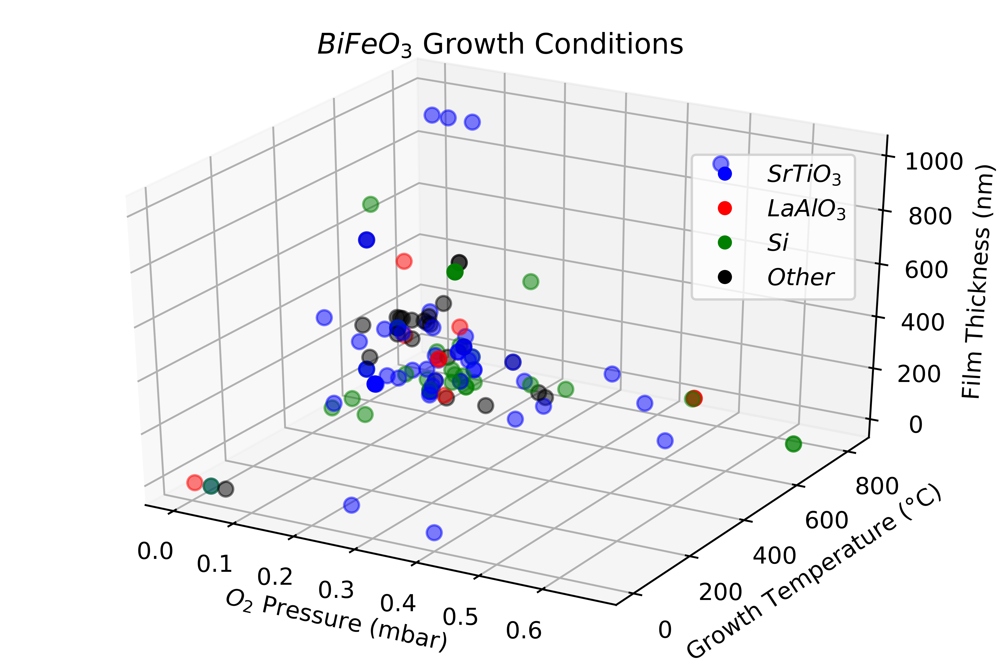

In [7]:
# plot data - BFO
plot_labels = ['$O_2$ Pressure (mbar)', 'Growth Temperature ($\degree$C)','Film Thickness (nm)']

bfo_fig, bfo_ax, count = plot_3d_scatter(BFO_entries, [0,1,2,3], 0, 1E-3, plot_labels, '$BiFeO_3$ Growth Conditions')

print('Number of BFO Entries', count)

bfo_fig.savefig(path.join(figure_folder, 'bfo_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
bfo_fig.savefig(path.join(figure_folder, 'bfo_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of BFO Entries 63


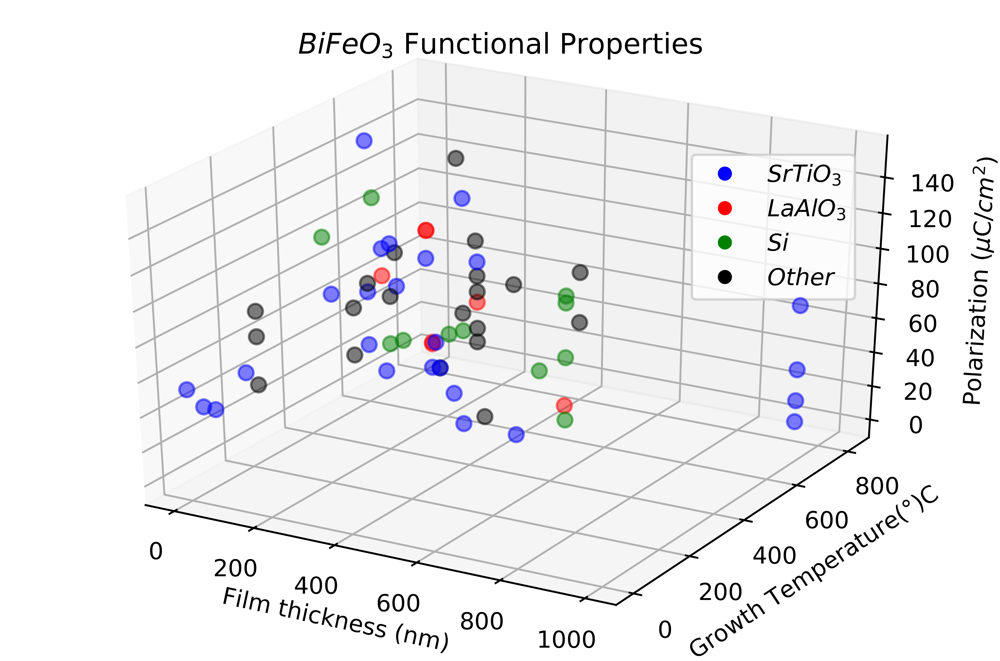

In [8]:
#Now start to check functional properties
#Note that the number of entries is going to be different, because not all films have the same number of entries, i.e. 
#there are many missing values for e.g. polarization, as it is not always reported.

plot_labels = ['Film thickness (nm)',  'Growth Temperature($\degree$)C', 'Polarization ($\mu$C/$cm^2$)']

bfo_f_fig, bfo_f_ax, bfo_f_count = plot_3d_scatter(BFO_entries, [2,1,6,3], 6, 1E-3, plot_labels, '$BiFeO_3$ Functional Properties')

print('Number of BFO Entries', bfo_f_count)

bfo_f_fig.savefig(path.join(figure_folder, 'bfo_f_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
bfo_f_fig.savefig(path.join(figure_folder, 'bfo_f_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)

Number of BFO  Entries 78


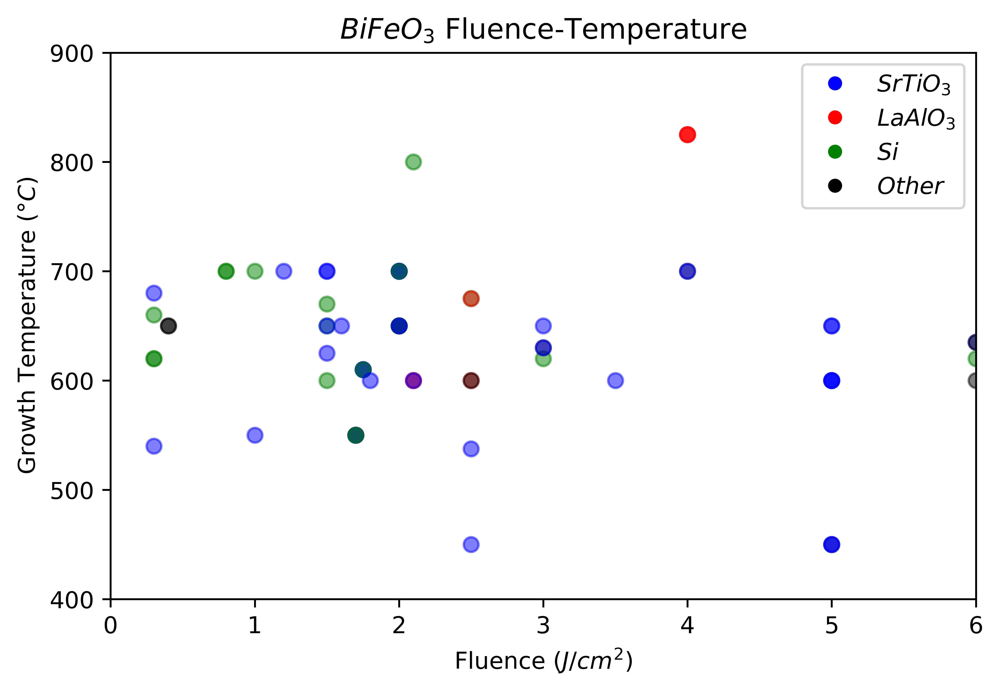

In [9]:
#Fluence vs temperature
plot_labels = ['Fluence ($J/cm^2$)',  'Growth Temperature ($\degree C$)']

bfo_fl_fig, bfo_fl_ax, bfo_fl_count = plot_2d_scatter(BFO_entries, [4,1,3], 4, 1E-3, plot_labels, 
                                             '$BiFeO_3$ Fluence-Temperature')

bfo_fl_ax.set_ylim([400, 900])
bfo_fl_ax.set_xlim([0,6])

print('Number of BFO  Entries', bfo_fl_count)

bfo_fl_fig.savefig(path.join(figure_folder, 'bfo_fl_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
bfo_fl_fig.savefig(path.join(figure_folder, 'bfo_fl_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of BFO  Entries 126


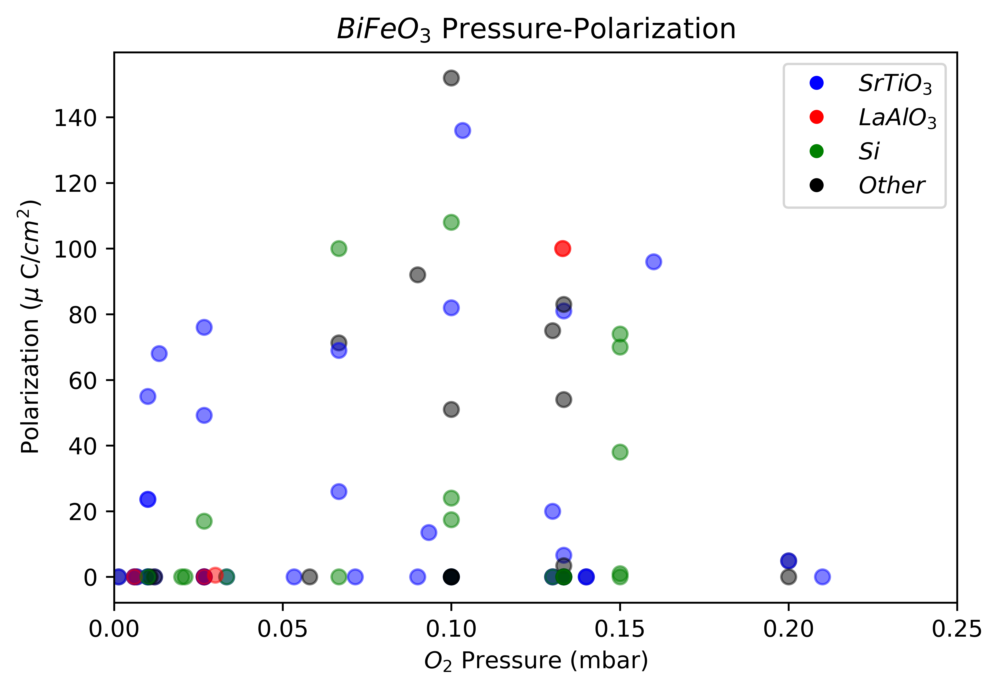

In [10]:
#Polarization vs O2
plot_labels = ['$O_2$ Pressure (mbar)',  'Polarization ($\mu$ C/$cm^2$)']

bfo_pp_fig, bfo_pp_ax, bfo_pp_count = plot_2d_scatter(BFO_entries, [0,6,3], 0, 0.001, plot_labels, 
                                             '$BiFeO_3$ Pressure-Polarization')

#bfo_pp_ax.set_ylim([400, 900])
bfo_pp_ax.set_xlim([0,.25])

print('Number of BFO  Entries',bfo_pp_count)

bfo_pp_fig.savefig(path.join(figure_folder, 'bfo_pp_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
bfo_pp_fig.savefig(path.join(figure_folder, 'bfo_pp_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


# (2) $Pb(Zr_x Ti_1-x)O_3$

Here, we take a look at the plots for PZT

Number of PZT Entries 53


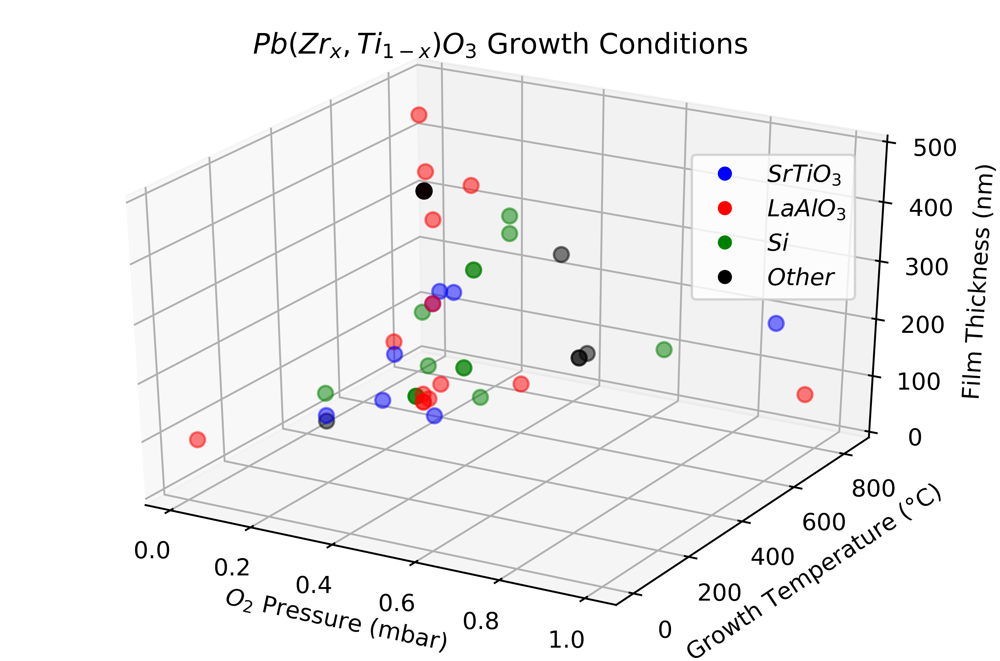

In [11]:
# plot data - PZT
plot_labels = ['$O_2$ Pressure (mbar)', 'Growth Temperature ($\degree$C)','Film Thickness (nm)']
pzt_fig, pzt_ax, pzt_count = plot_3d_scatter(PZT_entries, [0,1,2,3], 0, 1E-3, plot_labels, 
                                             '$Pb(Zr_x,Ti_{1-x})O_3$ Growth Conditions')
#pzt_ax.set_xlim([0, .6])
#pzt_ax.set_ylim([500, 800])
pzt_ax.set_zlim([0, 500])

print('Number of PZT Entries', pzt_count)

pzt_fig.savefig(path.join(figure_folder, 'pzt_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
pzt_fig.savefig(path.join(figure_folder, 'pzt_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of PZT Entries 20


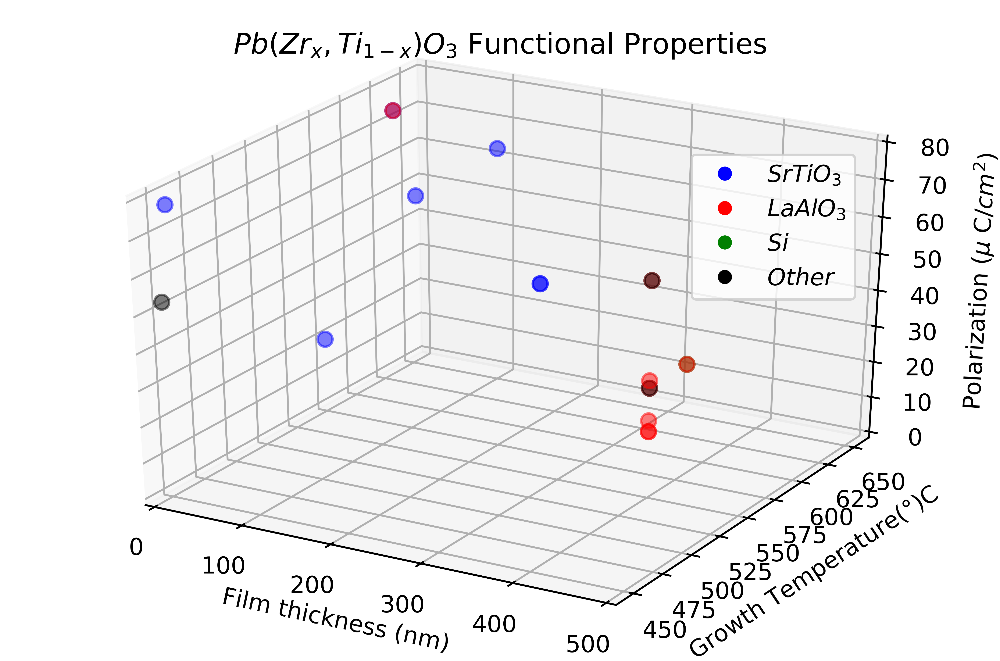

In [12]:
plot_labels = ['Film thickness (nm)',   'Growth Temperature($\degree$)C', 'Polarization ($\mu$ C/$cm^2$)']
#Functional Properties for PZT

plot_labels = ['Film thickness (nm)',   'Growth Temperature($\degree$)C', 'Polarization ($\mu$ C/$cm^2$)']

pzt_f_fig, pzt_f_ax, pzt_f_count = plot_3d_scatter(PZT_entries, [2,1,6,3], 6, 1E-3, plot_labels, 
                                             '$Pb(Zr_x,Ti_{1-x})O_3$ Functional Properties')

pzt_f_ax.set_xlim([0, 500])
pzt_f_ax.set_zlim([0, 80])

print('Number of PZT Entries', pzt_f_count)

pzt_f_fig.savefig(path.join(figure_folder, 'pzt_f_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
pzt_f_fig.savefig(path.join(figure_folder, 'pzt_f_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)

Number of PZT  Entries 62


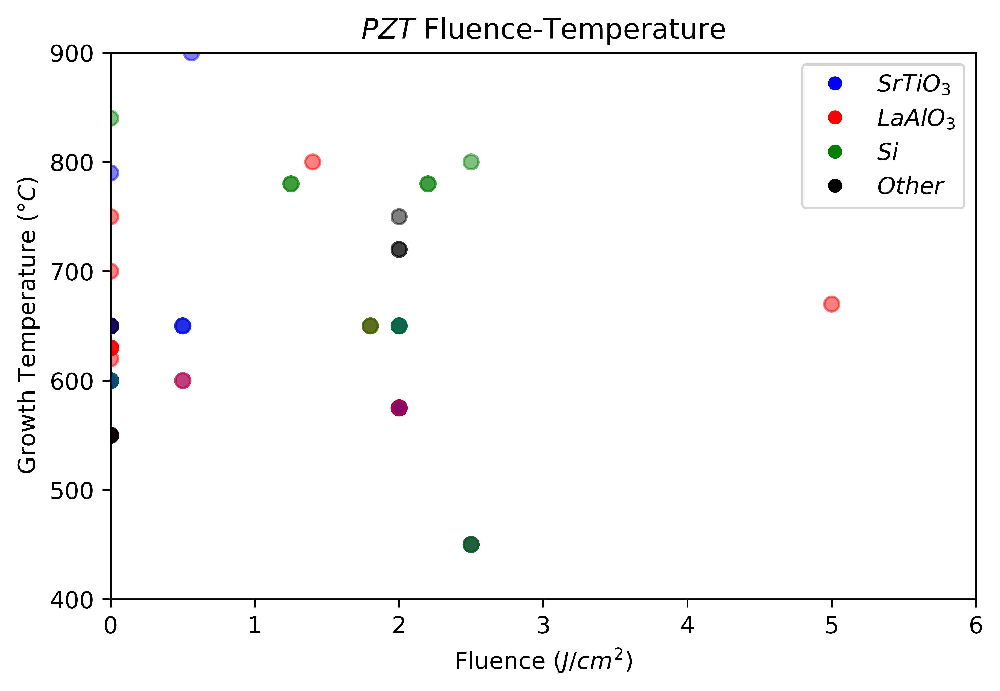

In [13]:
#Fluence vs temperature
plot_labels = ['Fluence ($J/cm^2$)',  'Growth Temperature ($\degree C$)']

pzt_fl_fig, pzt_fl_ax, pzt_fl_count = plot_2d_scatter(PZT_entries, [4,1,3], 1, 1E-3, plot_labels, 
                                             '$PZT$ Fluence-Temperature')

pzt_fl_ax.set_ylim([400, 900])
pzt_fl_ax.set_xlim([0,6])

print('Number of PZT  Entries', pzt_fl_count)

pzt_fl_fig.savefig(path.join(figure_folder, 'pzt_fl_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
pzt_fl_fig.savefig(path.join(figure_folder, 'pzt_fl_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of PZT  Entries 20


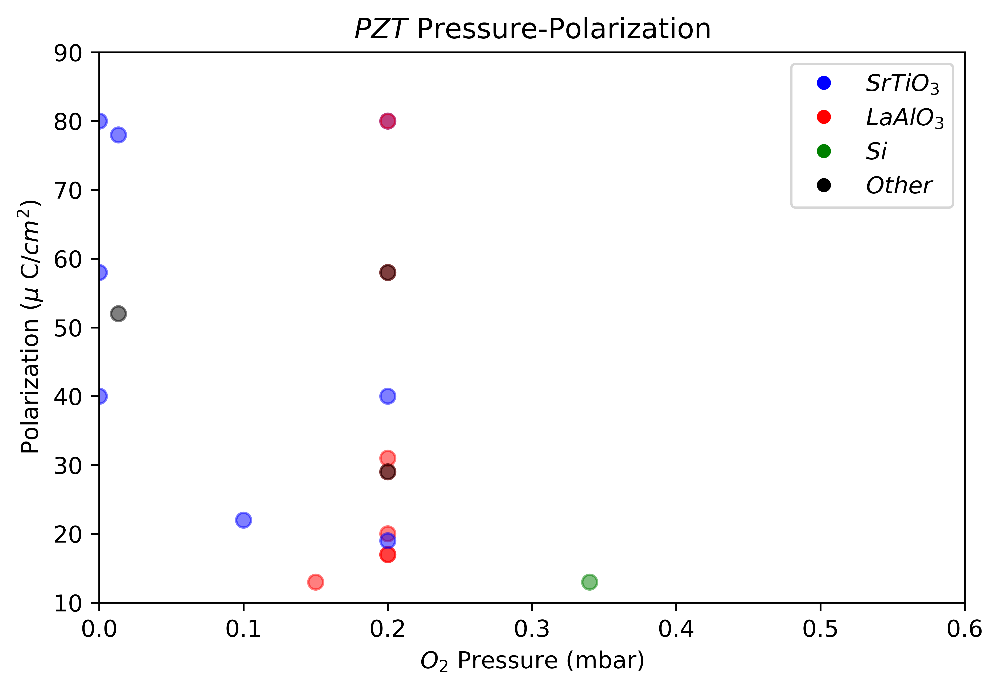

In [14]:
#Polarization vs O2
plot_labels = ['$O_2$ Pressure (mbar)',  'Polarization ($\mu$ C/$cm^2$)']


pzt_pp_fig, pzt_pp_ax, pzt_pp_count = plot_2d_scatter(PZT_entries, [0,6,3], 6, 1E-3, plot_labels, 
                                             '$PZT$ Pressure-Polarization')

pzt_pp_ax.set_ylim([10, 90])
pzt_pp_ax.set_xlim([0,.6])

print('Number of PZT  Entries', pzt_pp_count)

pzt_pp_fig.savefig(path.join(figure_folder, 'pzt_pp_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
pzt_pp_fig.savefig(path.join(figure_folder, 'pzt_pp_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


# (3) $La_{1-x}Sr_xMnO_3$ Plots

Now we take a look at a manganite, specifically, LSMO. This is one of the most commonly studied manganites, and used 
often as an  electrode in oxide heterostructures.

Number of LSMO  Entries 140


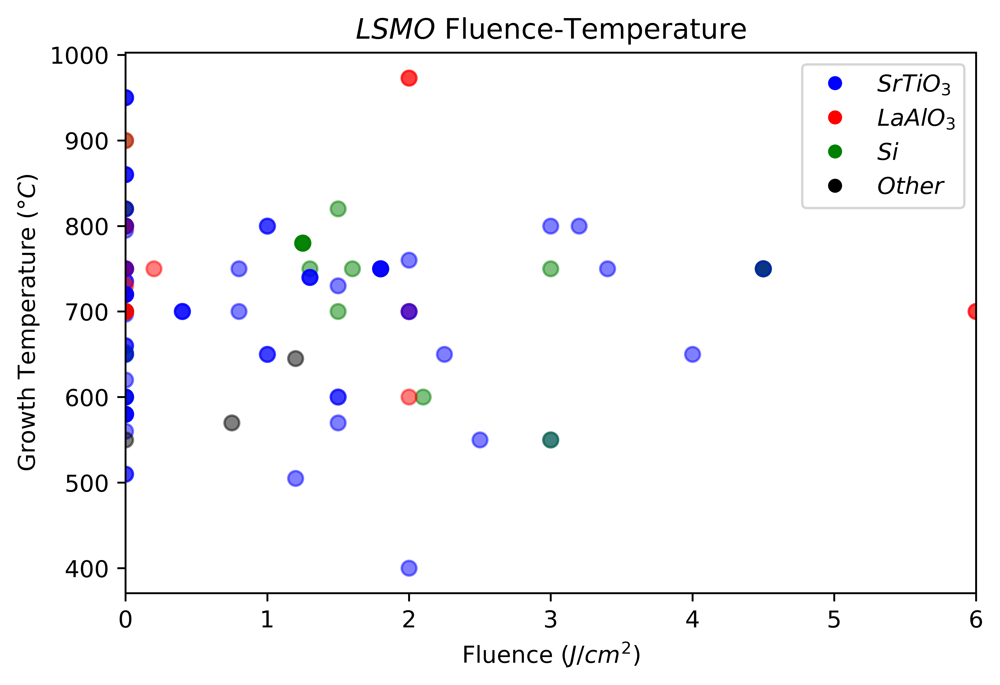

In [15]:
#Fluence vs temperature
plot_labels = ['Fluence ($J/cm^2$)',  'Growth Temperature ($\degree C$)']

lsmo_fl_fig, lsmo_fl_ax, lsmo_fl_count = plot_2d_scatter(LSMO_entries, [4,1,3], 1, 1E-3, plot_labels, 
                                             '$LSMO$ Fluence-Temperature')

#lcmo_fl_ax.set_ylim([500, 900])
lsmo_fl_ax.set_xlim([0,6])

print('Number of LSMO  Entries', lsmo_fl_count)

lsmo_fl_fig.savefig(path.join(figure_folder, 'lsmo_fl_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
lsmo_fl_fig.savefig(path.join(figure_folder, 'lsmo_fl_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of LSMO  Entries 67


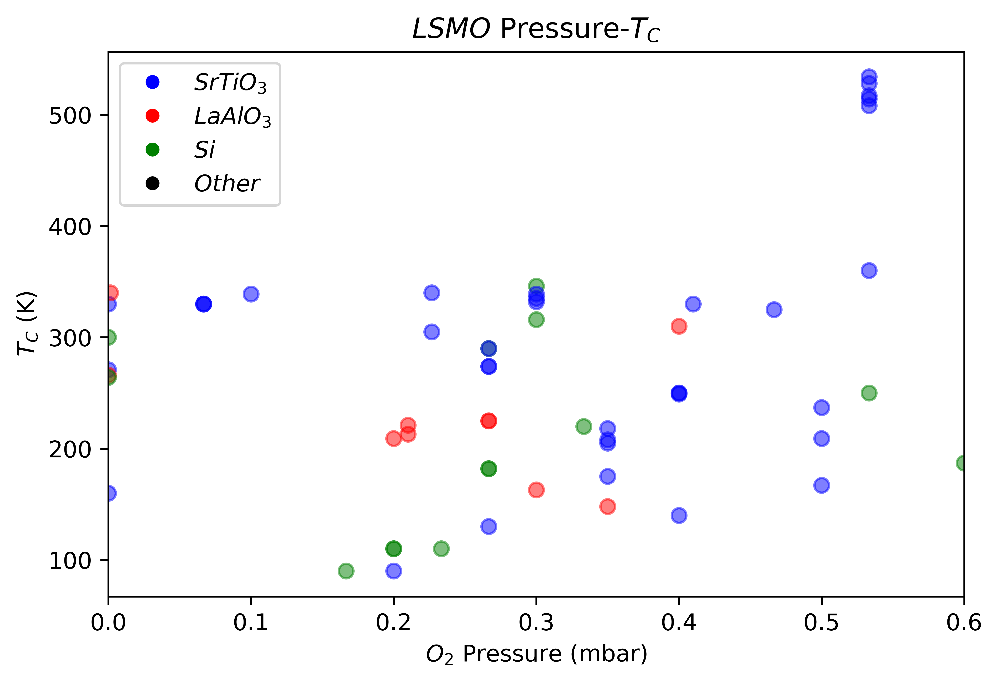

In [16]:
#Transition T vs O2
plot_labels = ['$O_2$ Pressure (mbar)',  '$T_C$ (K)']

lsmo_pp_fig, lsmo_pp_ax, lsmo_pp_count = plot_2d_scatter(LSMO_entries, [0,5,3], 5, 10, plot_labels, 
                                             '$LSMO$ Pressure-$T_C$')

#lsmo_pp_ax.set_ylim([10, 90])
lsmo_pp_ax.set_xlim([0,.6])

print('Number of LSMO  Entries', lsmo_pp_count)

lsmo_pp_fig.savefig(path.join(figure_folder, 'lsmo_pp_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
lsmo_pp_fig.savefig(path.join(figure_folder, 'lsmo_pp_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


# (4) $La_{1-x}Ca_xMnO_3$ Plots

Finally, we take a look at another manganite, LCMO. Indeed, LCMO and LSMO are extremely similar compounds, and thus we will exploit this fact in the section below.

Number of LCMO  Entries 65


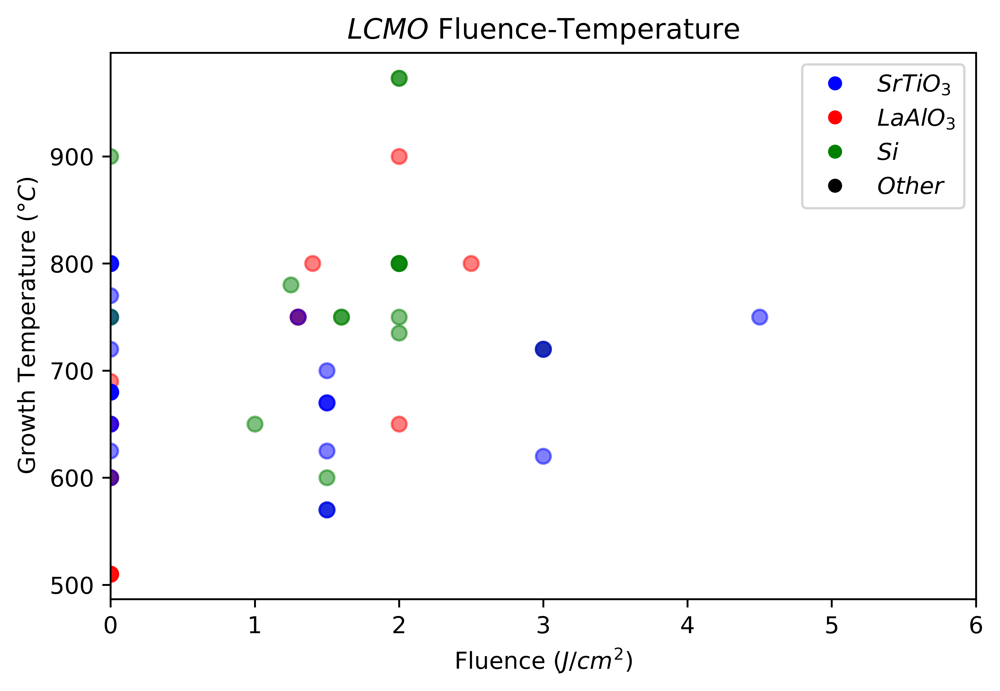

In [17]:
#Fluence vs temperature
plot_labels = ['Fluence ($J/cm^2$)',  'Growth Temperature ($\degree C$)']

lcmo_fl_fig, lcmo_fl_ax, lcmo_fl_count = plot_2d_scatter(LCMO_entries, [4,1,3], 1, 1E-3, plot_labels, 
                                             '$LCMO$ Fluence-Temperature')

#lcmo_fl_ax.set_ylim([500, 900])
lcmo_fl_ax.set_xlim([0,6])

print('Number of LCMO  Entries', lcmo_fl_count)

lcmo_fl_fig.savefig(path.join(figure_folder, 'lcmo_fl_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
lcmo_fl_fig.savefig(path.join(figure_folder, 'lcmo_fl_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


Number of LCMO  Entries 27


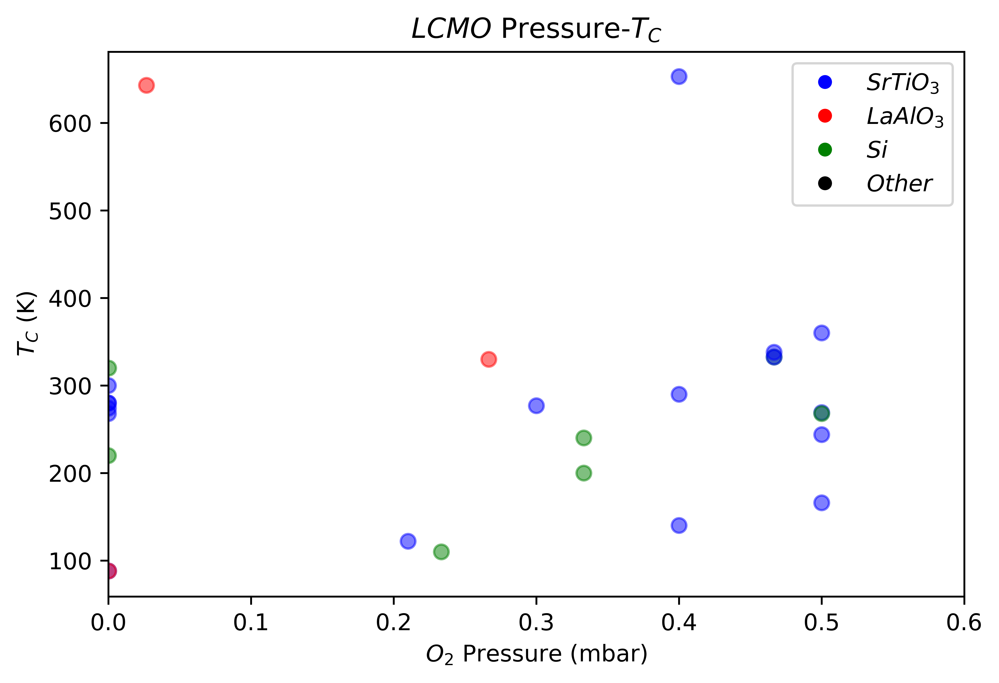

In [18]:
#Transition T vs O2
plot_labels = ['$O_2$ Pressure (mbar)',  '$T_C$ (K)']

lcmo_pp_fig, lcmo_pp_ax, lcmo_pp_count = plot_2d_scatter(LCMO_entries, [0,5,3], 5, 10, plot_labels, 
                                             '$LCMO$ Pressure-$T_C$')

#lcmo_pp_ax.set_ylim([10, 90])
lcmo_pp_ax.set_xlim([0,.6])

print('Number of LCMO  Entries', lcmo_pp_count)

lcmo_pp_fig.savefig(path.join(figure_folder, 'lcmo_pp_fig.svg'), format = 'svg', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)
lcmo_pp_fig.savefig(path.join(figure_folder, 'lcmo_pp_fig.png'), format = 'png', dpi = 600, bbox_inches = 'tight', pad_inches = 2.0)


# Analysis of data using correlation and machine learning

Here we wish to dive into the dataset, to determine whether correlations exist, and then explore whether material property prediction is possible through use of machine learning-based classifiers. We first use Canonical correlation analysis, to look for the strength of the correlations between the specific growth variables (in this case, growth temperature, $O_2$ pressure, and laser fluence) with the property of interest (in our case, the $T_C$ values). 

### Canonical Correlation Analysis (CCA)

#### In canonical correlation analysis, one attempts to determine how two matrices $X$ and $Y$ are correlated. This is done by seeking vectors $a$ and $b$ such that the random variables $a'X$ and $b'Y$ maximize the correlation $\rho = corr (a'X,b'Y)$

We do this on our dataset using scikit-learn's CCA decomposition. We apply it to the the manganites as a whole, i.e., Here we assume all the manganites have the same nominal composition. In reality, we have films of different compositions. However, most of the entries are for compositions between x = 0.2-0.4, so nominally as single crystals these compounds will have transition temperatures in the range of 200-270K. 

In [19]:
#Use both LSMO and LCMO entreis to get all the data
manganites_entries = np.vstack((LSMO_entries, LCMO_entries)) #Given that LSMO and LCMO have very similar phase diagrams,
                                            #we append them to increase the data size before doing machine learning.

#The features we want are growth temperature, growth pressure and fluence
#These correspond to columns 0,1,4
manganites_entries = manganites_entries[:,[0,1,4,5]] #Pressure, Temp, Fluence, Tc

#Let's do some pre-processing
#First, if there is no Tc, forget it.
#Second, if there is no growth temperature or pressure, forget it
#Thid, if there is no fluence, then forget that as well!

good_manganite_entries = []
for index, entry in enumerate(manganites_entries):
    if (entry[0]>1E-5 and entry[1]>100 and entry[3]>10 and entry[0]<0.8 and entry[3]<450):
        if entry[2]<1E-3 or entry[2]>10:
            pass#good_manganite_entries.append([index, entry[0], entry[1], fluence_avg, entry[3]])
        else:
            good_manganite_entries.append([index, entry[0], entry[1], entry[2], entry[3]])
            

In [20]:
#First check to see the correlation amongst the variables
#Do canonical correlation analysis

manganites_matrix = np.array(good_manganite_entries)[:,1:]

X = np.squeeze(manganites_matrix[:,:3])
Y = np.squeeze(manganites_matrix[:,3])
X_train, X_test, Y_train, Y_test = tts(X, Y, test_size=0.50)

cca = CCA(n_components=1)
cca.fit(X, Y)

X_train_r, Y_train_r = cca.transform(X_train, Y_train)
X_test_r, Y_test_r = cca.transform(X_test, Y_test)

CCA Score is: [ 0.63555669]


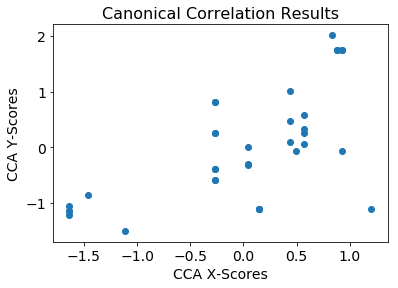

In [21]:
print('CCA Score is: ' + str(pearsonr(cca.x_scores_, cca.y_scores_)[0]))

fig, ax = plt.subplots()
ax.scatter(cca.x_scores_, cca.y_scores_)
ax.set_xlabel('CCA X-Scores', fontsize = 14)
ax.set_ylabel('CCA Y-Scores', fontsize = 14)
ax.set_title('Canonical Correlation Results', fontsize=16)
ax.tick_params(axis='both', labelsize=14)
fig.savefig(path.join(figure_folder, 'CCA_Results.png'), dpi=300, format = 'png', pad_inches = 2.0, bbox_inches = 'tight')
fig.savefig(path.join(figure_folder, 'CCA_Results.svg'), dpi=300, format = 'svg', pad_inches = 2.0, bbox_inches = 'tight')

## Machine Learning

The above correlation score is moderately high - so we may attempt further analysis with machine learning. 

Here we aim to make some trivial classifiers (in our case, a decision tree) that can predict the transition temperature given the input features (growth conditions).

This can be repeated to answer other questions, such as:
- Can we predict $P_r$ if given growth information?
- Is there a difference in the growth window for thicker films, than for thinner films?

### $T_C$ Classifier for Manganites
As a basic example, we attempt to create a decision tree classifier to predict the $T_C$ for the manganites given the input features (i.e., growth conditions).

We wish to determine whether the $T_C$ is low, medium or high, defined as:
low: <200K
medium: 200-300K
high: >300K


In [22]:
high_thresh = 300 #Tc above this is high. (label = 2)
low_thresh = 200 #Tc below this is low (label = 0)
#If Tc is <300 and >200, Tc is medium (label = 1)

manganites_matrix = np.array(good_manganite_entries)

#Construct the label matrix
label_matrix = np.zeros(shape = len(manganites_matrix))
for index, values in enumerate(manganites_matrix):
    Tc = values[-1]
    if Tc>high_thresh:
        label_matrix[index] = 2
    elif Tc<low_thresh:
        label_matrix[index] = 0
    else:
        label_matrix[index] = 1

manganites_label_mat = manganites_matrix[:,1:4]
manganites_label_mat = np.hstack((manganites_label_mat, label_matrix[:, np.newaxis]))

The accuracy of the Decision Tree classifier is: 0.73


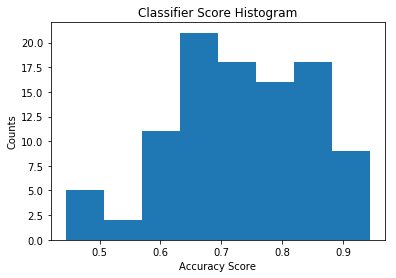

In [23]:
#Create a decision tree classifier
X = np.squeeze(manganites_label_mat[:,:3])
Y = np.squeeze(manganites_label_mat[:,3])

score_hist = []

for index in range(100): #Perform 100 times, to see how different selections affect the final accuracy.
    
    X_train, X_test, Y_train, Y_test = tts(X, Y, test_size=0.50) #Use a test/train split of 50/50
    clf = tree.DecisionTreeClassifier(max_depth = 4)
    clf = clf.fit(X_train, Y_train)
    score_hist.append(clf.score(X_test, Y_test))

fig, ax = plt.subplots()
ax.hist(score_hist, 8)
ax.set_xlabel("Accuracy Score")
ax.set_ylabel("Counts")
ax.set_title("Classifier Score Histogram")
print("The accuracy of the Decision Tree classifier is: {}".format(round(np.mean(score_hist),2)))

We can also visualize the decision tree, using the graphviz utility.

In [24]:
X = np.squeeze(manganites_label_mat[:,:3])
Y = np.squeeze(manganites_label_mat[:,3])

clf = tree.DecisionTreeClassifier(max_depth = 4)
clf = clf.fit(X, Y)
dot_data = tree.export_graphviz(clf, out_file=path.join(figure_folder, 'tree.dot'), 
                         feature_names=['Pressure', 'Temperature', 'Fluence'],  
                         class_names=['Low', 'Medium', 'High'],  
                         filled=True, rounded=True,  
                         special_characters=True)  
graph = graphviz.Source(dot_data)  
graph #If the graph does not display in the browser, please view the exported .dot file, in graphviz. 
#You may need the graphviz viewer (http://www.graphviz.org/) to do this

## Decision tree surface

If we wish to understand how the decision tree classifier 'makes' the classification, we can plot the so-called decision surface. However, this can only be done in 2-dimensions, and in actuality we have a three-dimensional input vector. Thus, the following should be seen as a guide only.

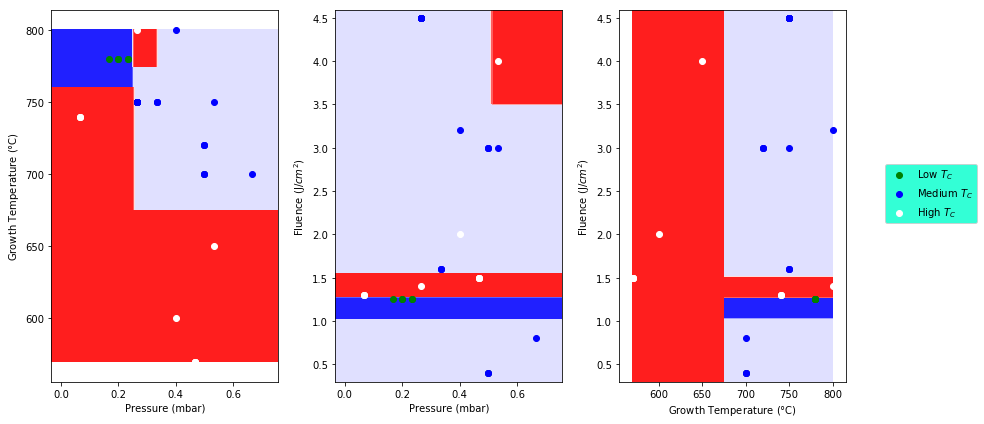

In [25]:
# Parameters
fig, ax= plt.subplots(figsize=(12,6), nrows=1,ncols=3)
n_classes = 3
plot_colors = "gbw"
plot_step = 0.01

# Load data
target_names = ['Low $T_C$','Medium $T_C$', 'High $T_C$']
feature_names = ['Pressure (mbar)', 'Growth Temperature ($\degree$C)', 'Fluence (J/$cm^2$)']

for pairidx, pair in enumerate([[0, 1], [0, 2], [1, 2]]):
    # We only take the two corresponding features
    X = np.squeeze(manganites_label_mat[:,pair])
    y = np.squeeze(manganites_label_mat[:,3])

    # Train
    clf = tree.DecisionTreeClassifier(max_depth=4).fit(X, y)

    # Plot the decision boundary
    

    x_min, x_max = X[:, 0].min()-.1, X[:, 0].max() + .1
    y_min, y_max = X[:, 1].min()-.1, X[:, 1].max() + .1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = ax[pairidx].contourf(xx, yy, Z, cmap=plt.cm.bwr)

    ax[pairidx].set_xlabel(feature_names[pair[0]])
    ax[pairidx].set_ylabel(feature_names[pair[1]])
    plt.axis("tight")

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.where(y == i)
        ax[pairidx].scatter(X[idx, 0], X[idx, 1], c=color, label=target_names[i],
                    cmap=plt.cm.Paired)

    plt.axis("tight")

#plt.suptitle("Decision surface of a decision tree using paired features")
legend = plt.legend(bbox_to_anchor = (1.60, 0.6))
legend.get_frame().set_facecolor('#00FFCC')
fig.subplots_adjust(left=0.2, wspace=0.8, top=0.9)
fig.tight_layout()

plt.show()
fig.savefig(path.join(figure_folder, 'DT_surface.png'), dpi=300, format = 'png', pad_inches = 2.0, bbox_inches = 'tight')
fig.savefig(path.join(figure_folder, 'DT_surface.svg'), dpi=300, format = 'svg', pad_inches = 2.0, bbox_inches = 'tight')

# Another Visualization Method for the growth windows
Here we show another method to visualize the growth windows, through basic plotting and fitting of a 2D gaussian model

In [157]:
#Clean up the entries and append them to a list for plotting

mat_entries = []
for entries in [BFO_entries, LCMO_entries, LSMO_entries, PZT_entries]:
    mat = entries[:, [1,0]]
    bad_T_vals = (np.where(mat[:,0]<400)[0])
    mat[bad_T_vals, 0] = np.median(mat[:,0])
    bad_p_vals = (np.where(mat[:,1]>1.0)[0])
    mat[bad_p_vals, 1] = np.median(mat[:,1])
    bad_p_vals = (np.where(mat[:,1]<1E-6)[0])
    mat[bad_p_vals, 1] = np.median(mat[:,1])
    new_p_vals =[]
    [new_p_vals.append(np.log(p)) for p in mat[:,1]]
    mat[:,1] = np.array(new_p_vals)
    mat_entries.append(mat)

#Define convenience function for plotting
def return_integer_labels(float_arr):
    labels = []
    [labels.append(str(int(arr))) for arr in float_arr]
    return labels

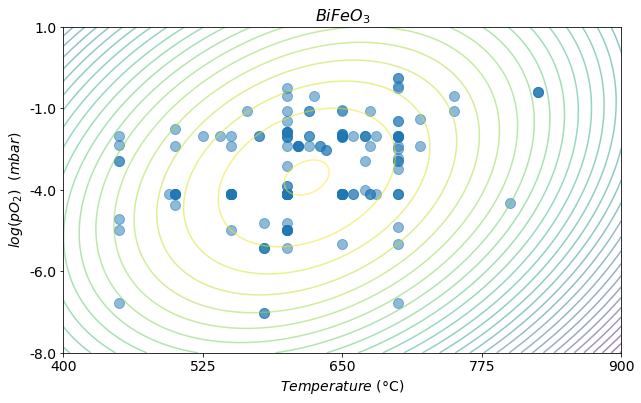

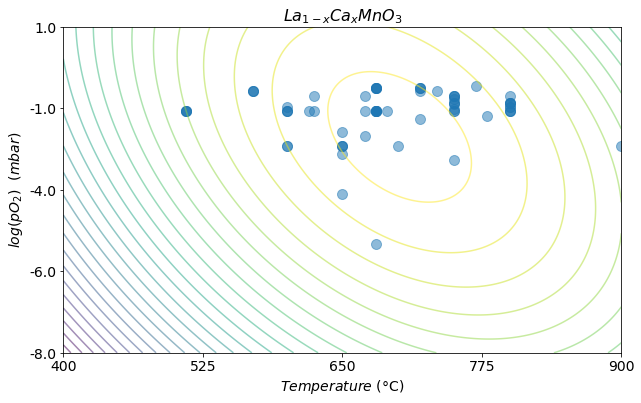

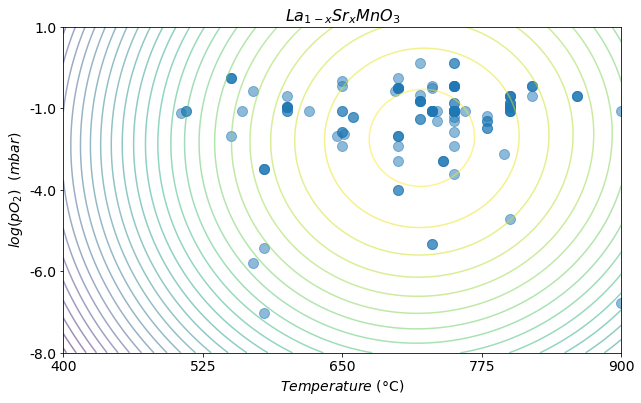

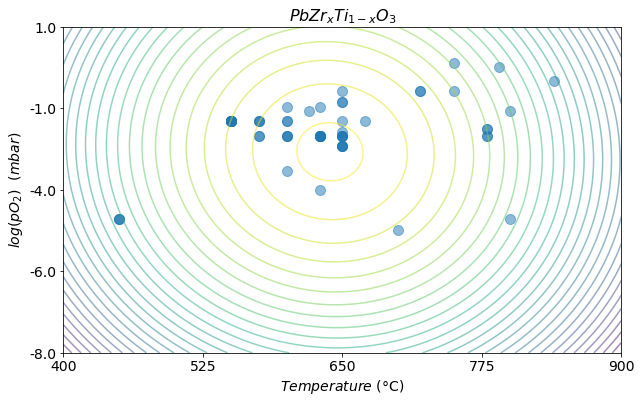

In [158]:
X_new = np.linspace(400, 900,400 )
Y_new = np.linspace(-8, 1.0, 400)
x,y = np.array(np.meshgrid(X_new, Y_new))
X = np.vstack((x.flatten(),y.flatten())).T

plt.close('all')
for mat, title in zip(mat_entries, ['$BiFeO_3$', '$La_{1-x}Ca_xMnO_3$', '$La_{1-x}Sr_xMnO_3$', '$PbZr_xTi_{1-x}O_3$']):
    fig, axes =plt.subplots(figsize = (10,6))
    axes.set_ylabel('$log (pO_2)$  $(mbar)$', fontsize = 14)
    axes.set_xlabel('$Temperature$ ($\degree$C)', fontsize = 14)
    axes.set_title(title, fontsize = 16)
    axes.scatter(mat[:, 0], mat[:, 1], s=100, alpha= 0.5);

    gmix = mixture.GMM(n_components=1, covariance_type='full');
    gmix.fit(mat);

    Z = gmix.score(X).reshape(400,400);
    CS = axes.contour(x, y, Z, 30, alpha=0.5);
    axes.set_xticks(np.linspace(400,900,5))
    axes.set_xticklabels(return_integer_labels(np.linspace(400,900,5)), fontsize = 14)
    axes.set_yticks(np.linspace(-8,1,5))
    axes.set_yticklabels(np.round(np.linspace(-8,1,5),0), fontsize = 14)
    
    axes.set_xlim([400,900])
    axes.set_ylim([-8,1.0])
    fig.savefig(path.join(folder_path, title + ' Gaussian' + '.png'), dpi = 300, bbox_inches ='tight', pad_inches =1.0)